In [7]:

import pandas as pd

import time
import os
import cv2
import numpy as np
import tensorflow as tf
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from tensorflow.keras.preprocessing.image import img_to_array,load_img

# optional
# from google.colab.patches import cv2_imshow
from PIL import Image
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
%matplotlib inline


# Enable GPU dynamic memory allocation (do not use this for colab)
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)


In [8]:
PATH_TO_SAVED_MODEL_1 = "../exported-models/centernet_resnet101_v1_512x512/saved_model"

PATH_TO_LABELS = "../annotations/label_map.pbtxt"

print('Loading Model...')
start_time = time.time()
loaded_model_1 = tf.saved_model.load(PATH_TO_SAVED_MODEL_1)
print('Model loaded, pbtxt loading....')
# Loading the pbtxt
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

print('Done! Took {} seconds'.format(time.time() - start_time))

Loading Model...
Model loaded, pbtxt loading....
Done! Took 72.45695877075195 seconds


In [9]:
def show_inference(model,frame):
      test_image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      # OpenCV reads images in BGR format. So for us to work we need RGB format.
      test_image_array_ex = np.expand_dims(test_image_rgb, axis=0)

      test_image_tensor = tf.convert_to_tensor(test_image_array_ex)
      test_image_tensor = tf.cast(test_image_tensor, tf.uint8) #changinig the dtype according to serving_default.

      
      # Predictions
      with tf.device('/cpu:0'):
            prediction = model(test_image_tensor)
        
      num_bboxes = int(prediction.pop('num_detections'))
      prediction = {key: value[0, :num_bboxes].numpy() for key, value in prediction.items()}
      prediction['num_detections'] = num_bboxes
          
      # detection_classes should be ints.
      prediction['detection_classes'] = prediction['detection_classes'].astype(np.int64)
              

      image_with_detections = test_image_rgb.copy()
      viz_utils.visualize_boxes_and_labels_on_image_array(
            image_with_detections,
            prediction['detection_boxes'],
            prediction['detection_classes'],
            prediction['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=5,
            min_score_thresh=0.5,
            agnostic_mode=False)
      # return cv2.cvtColor(image_with_detections, cv2.COLOR_RGB2BGR)
      return image_with_detections
      # return prediction,prediction2

In [ ]:
df = pd.read_csv('../annotations/csvs/uncropped_res_capped_balanced/test.csv')
train_df = pd.read_csv('../annotations/csvs/uncropped_res_capped_balanced/train.csv')
# df.head()
data = pd.read_csv('../annotations/csvs/no_bads_atall_annos.csv')

In [ ]:
# fig,axes = plt.subplots(nrows = 1, ncols = 4, figsize=(30,30))
# for ax in axes.flatten():
#     ax.axis('off')
# ax = axes.flatten()
i=0
plt.figure(figsize=(50,50))
for img_path in df[(df['width']>1199) & (df['height']>1199)]['image_name'].sample(5):
    test_image_o = cv2.imread(img_path)
    inference = show_inference(loaded_model_1,test_image_o)

    im = Image.fromarray(inference, 'RGB')
    i=i+1
    plt.subplot(3,3,i+1)
    plt.axis('off')
    plt.imshow(inference)
plt.show()

In [ ]:
test_image_o = cv2.imread('images/000061.jpg')
inference = show_inference(loaded_model_1,test_image_o)

from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
Image.fromarray(inference, 'RGB')

In [8]:
cls_lst = df['class'].unique()

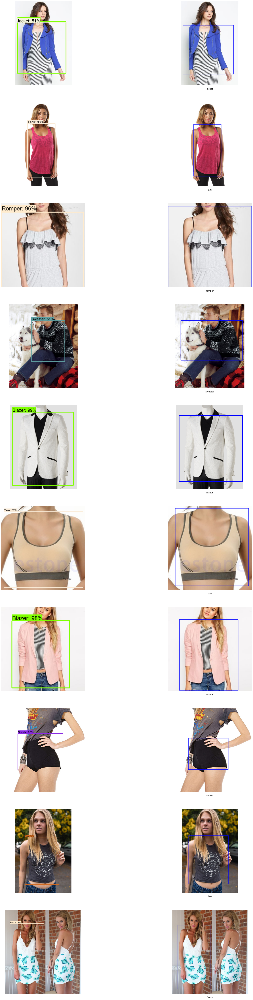

In [7]:
plt.figure(figsize=(30,100))
samples = 10
# for i,d in df[df['class']==cls_lst[2]].sample(samples).reset_index().iterrows():
for i,d in df.sample(samples).reset_index().iterrows():
    test_image_o = cv2.imread(d['filename'])
    
    inference = show_inference(loaded_model_1,test_image_o)
    
    x1,y1,x2,y2 = d[['xmin','ymin','xmax','ymax']].values
    grndimg = cv2.rectangle(test_image_o,(x1,y1),(x2,y2),(255, 0, 0), 2)
    
    plt.subplot(samples,2,i*2+1)
    plt.axis('off')
    plt.imshow(inference)

    
    p = plt.subplot(samples,2,i*2+2)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(grndimg, cv2.COLOR_BGR2RGB))
    plt.text(0.5,-0.05, d['class'], size=12, ha="center",transform=p.transAxes)
    
plt.show()

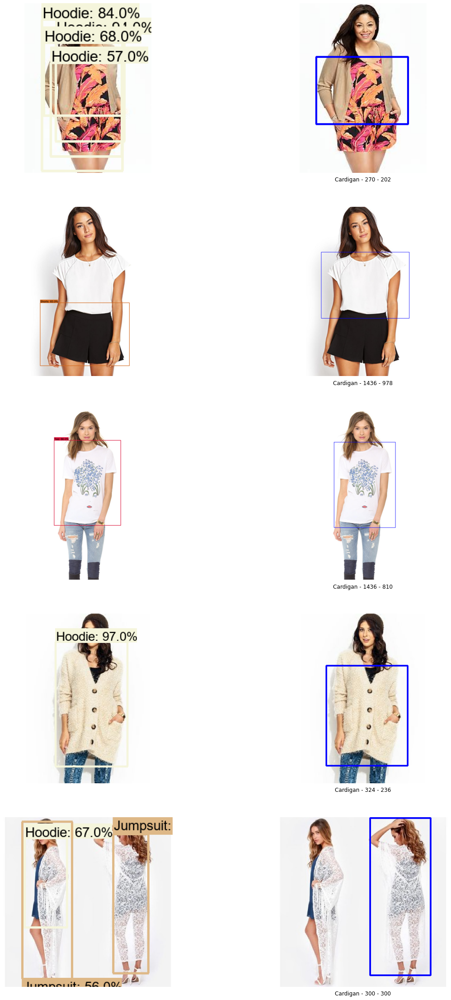

In [51]:
plt.figure(figsize=(20,40))
for i,d in data[data['category_name']==cls_lst[2]].sample(5).reset_index().iterrows():
    test_image_o = cv2.imread(d['image_name'])
    
    inference = show_inference(loaded_model_1,test_image_o)
    
    x1,y1,x2,y2 = d[['hx_1','hy_1','hx_2','hy_2']].values
    grndimg = cv2.rectangle(test_image_o,(x1,y1),(x2,y2),(255, 0, 0), 2)
    
    plt.subplot(5,2,i*2+1)
    plt.axis('off')
    plt.imshow(inference)

    
    p = plt.subplot(5,2,i*2+2)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(grndimg, cv2.COLOR_BGR2RGB))
    txt = d['category_name']+' - '+str(d['height'])+' - '+str(d['width'])
    plt.text(0.5,-0.05, txt, size=12, ha="center",transform=p.transAxes)
    
plt.show()

In [62]:
for clss in cls_lst:
    print('Above 600X600 for {} \t: {}'.format(clss,train_df[(train_df['width']>600) & (train_df['height']>(600)) & (train_df['class']==clss)].shape[0]/train_df[train_df['class']==clss].shape[0]))

Above 600X600 for Blazer 	: 0.385625
Above 600X600 for Blouse 	: 0.9959375
Above 600X600 for Cardigan 	: 0.704375
Above 600X600 for Dress 	: 1.0
Above 600X600 for Hoodie 	: 0.24872405580129295
Above 600X600 for Jacket 	: 0.5378125
Above 600X600 for Jeans 	: 0.4328125
Above 600X600 for Joggers 	: 0.295625
Above 600X600 for Jumpsuit 	: 0.345625
Above 600X600 for Leggings 	: 0.2771875
Above 600X600 for Romper 	: 0.4071875
Above 600X600 for Shorts 	: 0.8875
Above 600X600 for Skirt 	: 0.7784375
Above 600X600 for Sweater 	: 0.6690625
Above 600X600 for Tank 	: 0.8071875
Above 600X600 for Tee 	: 0.99875
Above 600X600 for Top 	: 0.550625


In [58]:
# train_df[(train_df['width']>600) & (train_df['height']>(600)) & (train_df['class']==clss)].shape[0]/train_df[train_df['class']=='Blazer'].shape[0]

0.385625

- Checking for ssd resnet 101

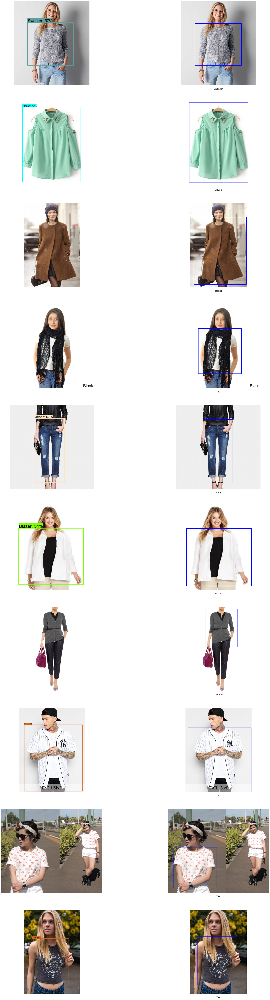

In [7]:
plt.figure(figsize=(30,100))
samples = 10
# for i,d in df[df['class']==cls_lst[2]].sample(samples).reset_index().iterrows():
for i,d in df.sample(samples).reset_index().iterrows():
    test_image_o = cv2.imread(d['filename'])
    
    inference = show_inference(loaded_model_1,test_image_o)
    
    x1,y1,x2,y2 = d[['xmin','ymin','xmax','ymax']].values
    grndimg = cv2.rectangle(test_image_o,(x1,y1),(x2,y2),(255, 0, 0), 2)
    
    plt.subplot(samples,2,i*2+1)
    plt.axis('off')
    plt.imshow(inference)

    
    p = plt.subplot(samples,2,i*2+2)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(grndimg, cv2.COLOR_BGR2RGB))
    plt.text(0.5,-0.05, d['class'], size=12, ha="center",transform=p.transAxes)
    
plt.show()

- testing for efficient det

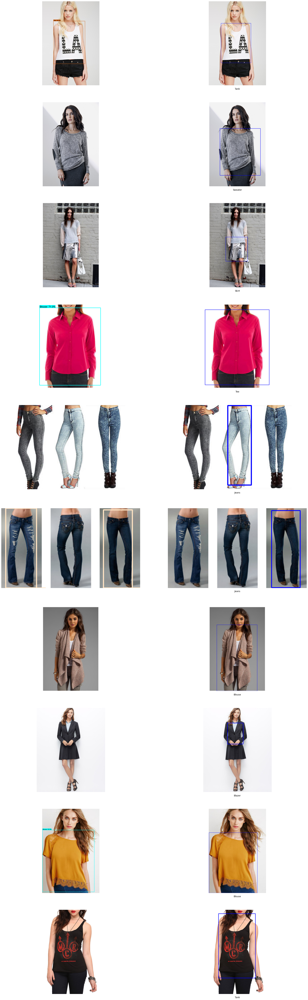

In [14]:
# Image_base_path = 'C:/Programming/PythOn/Projects/CBIR/Implementation/Project Data/deepfashion1/'
plt.figure(figsize=(30,100))
samples = 10
# for i,d in df[df['class']==cls_lst[2]].sample(samples).reset_index().iterrows():
for i,d in df.sample(samples).reset_index().iterrows():
    # test_image_o = cv2.imread(Image_base_path+d['filename'])
    test_image_o = cv2.imread(d['filename'])
    
    inference = show_inference(loaded_model_1,test_image_o)
    
    x1,y1,x2,y2 = d[['xmin','ymin','xmax','ymax']].values
    grndimg = cv2.rectangle(test_image_o,(x1,y1),(x2,y2),(255, 0, 0), 2)
    
    plt.subplot(samples,2,i*2+1)
    plt.axis('off')
    plt.imshow(inference)

    
    p = plt.subplot(samples,2,i*2+2)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(grndimg, cv2.COLOR_BGR2RGB))
    plt.text(0.5,-0.05, d['class'], size=12, ha="center",transform=p.transAxes)
    
plt.show()

- Checking centernet resnet

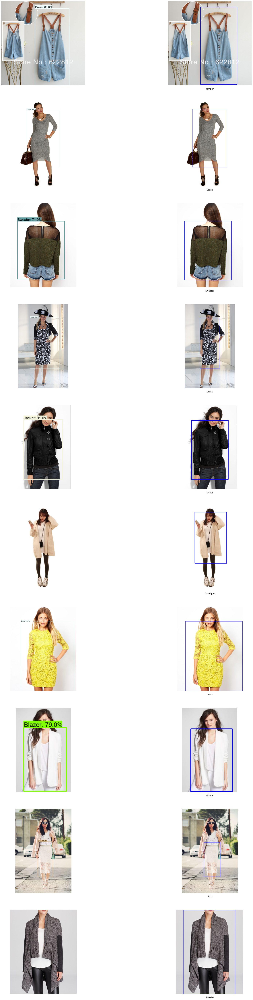

In [7]:
plt.figure(figsize=(30,100))
samples = 10
# for i,d in df[df['class']==cls_lst[2]].sample(samples).reset_index().iterrows():
for i,d in df.sample(samples).reset_index().iterrows():
    test_image_o = cv2.imread(d['filename'])
    
    inference = show_inference(loaded_model_1,test_image_o)
    
    x1,y1,x2,y2 = d[['xmin','ymin','xmax','ymax']].values
    grndimg = cv2.rectangle(test_image_o,(x1,y1),(x2,y2),(255, 0, 0), 2)
    
    plt.subplot(samples,2,i*2+1)
    plt.axis('off')
    plt.imshow(inference)

    
    p = plt.subplot(samples,2,i*2+2)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(grndimg, cv2.COLOR_BGR2RGB))
    plt.text(0.5,-0.05, d['class'], size=12, ha="center",transform=p.transAxes)
    
plt.show()

# Evaluation code

- to run the evaluation on model_main_tf2.py, we need to do this first 
- pip install numpy==1.17.4
- then upgdrade the numpy when the evaluation is done.
- so rather that this it is adviced to run the evaluation on server itself and then transfer th efolder here.

In [1]:
# Go to model folder in 'mymodels' folder and run following commands in cmd
print('''conda activate tfod3
    tensorboard --logdir=.''')

conda activate tfod3
tensorboard --logdir=.


- efficient det

In [17]:
# Run this command in trainig folder in cmd or terminal in vscode
model_name = 'efficientdet_d1'
print('python model_main_tf2.py --model_dir=my_model/{0} --pipeline_config_path=my_model/{0}/pipeline.config --checkpoint_dir=my_model/{0} --alsologtostderr'.format(model_name))
# '''python model_main_tf2.py --model_dir=my_model/faster_rcnn_resnet101_v1_640x640 --pipeline_config_path=my_model/faster_rcnn_resnet101_v1_640x640/pipeline.config --checkpoint_dir=my_model/faster_rcnn_resnet101_v1_640x640 --alsologtostderr'''

python model_main_tf2.py --model_dir=my_model/efficientdet_d1 --pipeline_config_path=my_model/efficientdet_d1/pipeline.config --checkpoint_dir=my_model/efficientdet_d1 --alsologtostderr


- faster rcnn

In [1]:
# Run this command in trainig folder in cmd or terminal in vscode
model_name = 'faster_rcnn_resnet101_v1_640x640'
print('python model_main_tf2.py --model_dir=my_model/{0} --pipeline_config_path=my_model/{0}/pipeline.config --checkpoint_dir=my_model/{0} --alsologtostderr'.format(model_name))

python model_main_tf2.py --model_dir=my_model/faster_rcnn_resnet101_v1_640x640 --pipeline_config_path=my_model/faster_rcnn_resnet101_v1_640x640/pipeline.config --checkpoint_dir=my_model/faster_rcnn_resnet101_v1_640x640 --alsologtostderr


- ssd resnet

In [2]:
# Run this command in trainig folder in cmd or terminal in vscode
model_name = 'ssd_resnet101_v1_fpn_640x640'
print('python model_main_tf2.py --model_dir=my_model/{0} --pipeline_config_path=my_model/{0}/pipeline.config --checkpoint_dir=my_model/{0} --alsologtostderr'.format(model_name))

python model_main_tf2.py --model_dir=my_model/ssd_resnet101_v1_fpn_640x640 --pipeline_config_path=my_model/ssd_resnet101_v1_fpn_640x640/pipeline.config --checkpoint_dir=my_model/ssd_resnet101_v1_fpn_640x640 --alsologtostderr


In [1]:
# Run this command in trainig folder in cmd or terminal in vscode
model_name = 'ssd_resnet152_v1_fpn_640x640'
print('python model_main_tf2.py --model_dir=my_model/{0} --pipeline_config_path=my_model/{0}/pipeline.config --checkpoint_dir=my_model/{0} --alsologtostderr'.format(model_name))

python model_main_tf2.py --model_dir=my_model/ssd_resnet152_v1_fpn_640x640 --pipeline_config_path=my_model/ssd_resnet152_v1_fpn_640x640/pipeline.config --checkpoint_dir=my_model/ssd_resnet152_v1_fpn_640x640 --alsologtostderr


In [1]:
# Run this command in trainig folder in cmd or terminal in vscode
model_name = 'centernet_resnet101_v1_512x512'
print('python model_main_tf2.py --model_dir=my_model/{0} --pipeline_config_path=my_model/{0}/pipeline.config --checkpoint_dir=my_model/{0} --alsologtostderr'.format(model_name))

python model_main_tf2.py --model_dir=my_model/centernet_resnet101_v1_512x512 --pipeline_config_path=my_model/centernet_resnet101_v1_512x512/pipeline.config --checkpoint_dir=my_model/centernet_resnet101_v1_512x512 --alsologtostderr


### Trying

In [1]:
import os
import scipy.misc
import tensorflow as tf

def save_images_from_event(fn, tag, output_dir='./'):
    assert(os.path.isdir(output_dir))

    image_str = tf.placeholder(tf.string)
    im_tf = tf.image.decode_image(image_str)

    sess = tf.InteractiveSession()
    with sess.as_default():
        count = 0
        for e in tf.train.summary_iterator(fn):
            for v in e.summary.value:
                if v.tag == tag:
                    im = im_tf.eval({image_str: v.image.encoded_image_string})
                    output_fn = os.path.realpath('{}/image_{:05d}.png'.format(output_dir, count))
                    print("Saving '{}'".format(output_fn))
                    scipy.misc.imsave(output_fn, im)
                    count += 1 

In [2]:
save_images_from_event('my_model/ssd_resnet152_v1_fpn_640x640', 'tag0')

AttributeError: module 'tensorflow' has no attribute 'placeholder'